<a href="https://colab.research.google.com/github/IchrakJh/Checkpoints_props/blob/main/Copie_de_Yolov9_juillet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!nvidia-smi

Sat Jul 27 22:41:23 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0              46W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [4]:
!git clone https://github.com/SkalskiP/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (218/218), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 325 (delta 159), reused 156 (delta 156), pack-reused 107
Receiving objects: 100% (325/325), 2.23 MiB | 12.86 MiB/s, done.
Resolving deltas: 100% (165/165), done.
/content/yolov9
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 708.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 27.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 59.4 MB/s eta 0:00:00


In [5]:
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.7 MB/s eta 0:00:00


In [6]:
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

In [7]:
!ls -la {HOME}/weights

total 402440
drwxr-xr-x 2 root root      4096 Jul 27 22:42 .
drwxr-xr-x 1 root root      4096 Jul 27 22:42 ..
-rw-r--r-- 1 root root  51508261 Feb 18 12:36 gelan-c.pt
-rw-r--r-- 1 root root 117203713 Feb 18 12:36 gelan-e.pt
-rw-r--r-- 1 root root 103153312 Feb 18 12:36 yolov9-c.pt
-rw-r--r-- 1 root root 140217688 Feb 18 12:36 yolov9-e.pt


In [8]:
%cd {HOME}/yolov9

/content/yolov9


In [45]:
from roboflow import Roboflow
rf = Roboflow(api_key="xqtkcbJrDSkmk9lnNIOm")
project = rf.workspace("hj-55zt3").project("gun-detection-sans-k")
version = project.version(3)
dataset = version.download("yolov9")

loading Roboflow workspace...
loading Roboflow project...


In [46]:
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 10 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-07-28 01:01:57.301081: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-28 01:01:57.352709: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-28 01:01:57.352752: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-28 01:01:57.354332: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-28 01:01:57.361884: I tensorflow/core/platform/

In [15]:
!ls /content/yolov9/runs/train/exp/

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1722100023.c8876ed2b600.3584.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


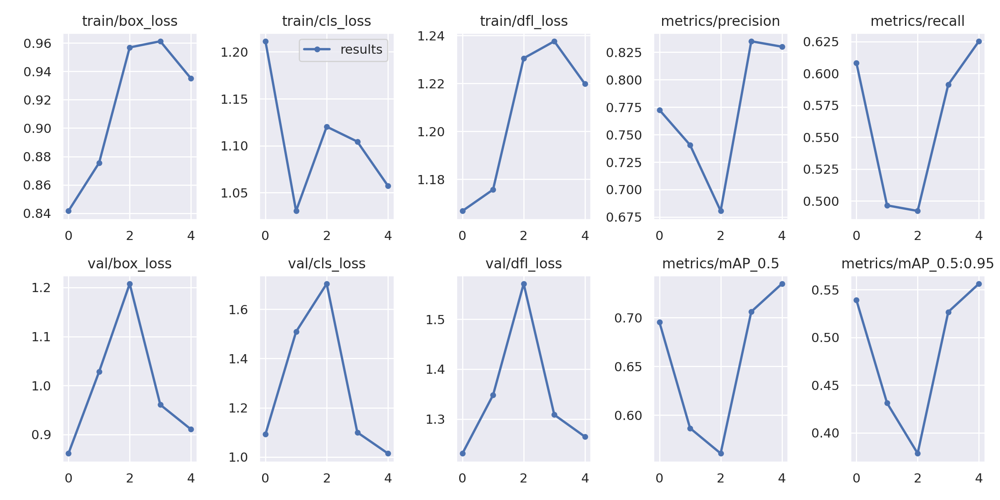

In [16]:
from IPython.display import Image

Image(filename=f"/content/yolov9/runs/train/exp2/results.png", width=1000)

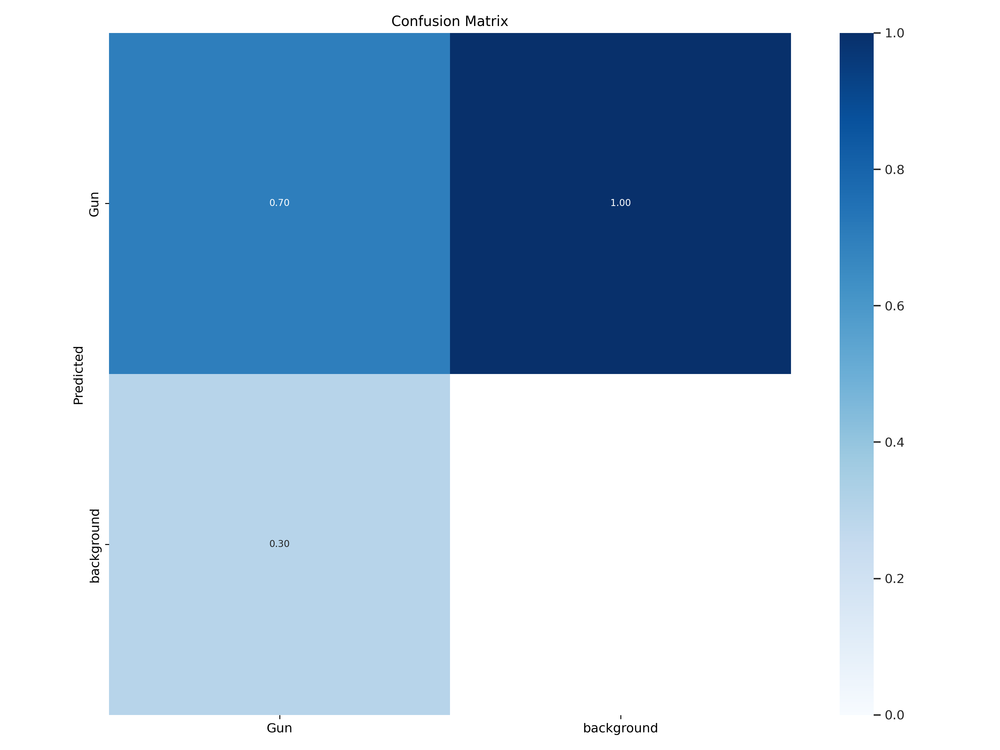

In [17]:
from IPython.display import Image

Image(filename=f"/content/yolov9/runs/train/exp2/confusion_matrix.png", width=1000)

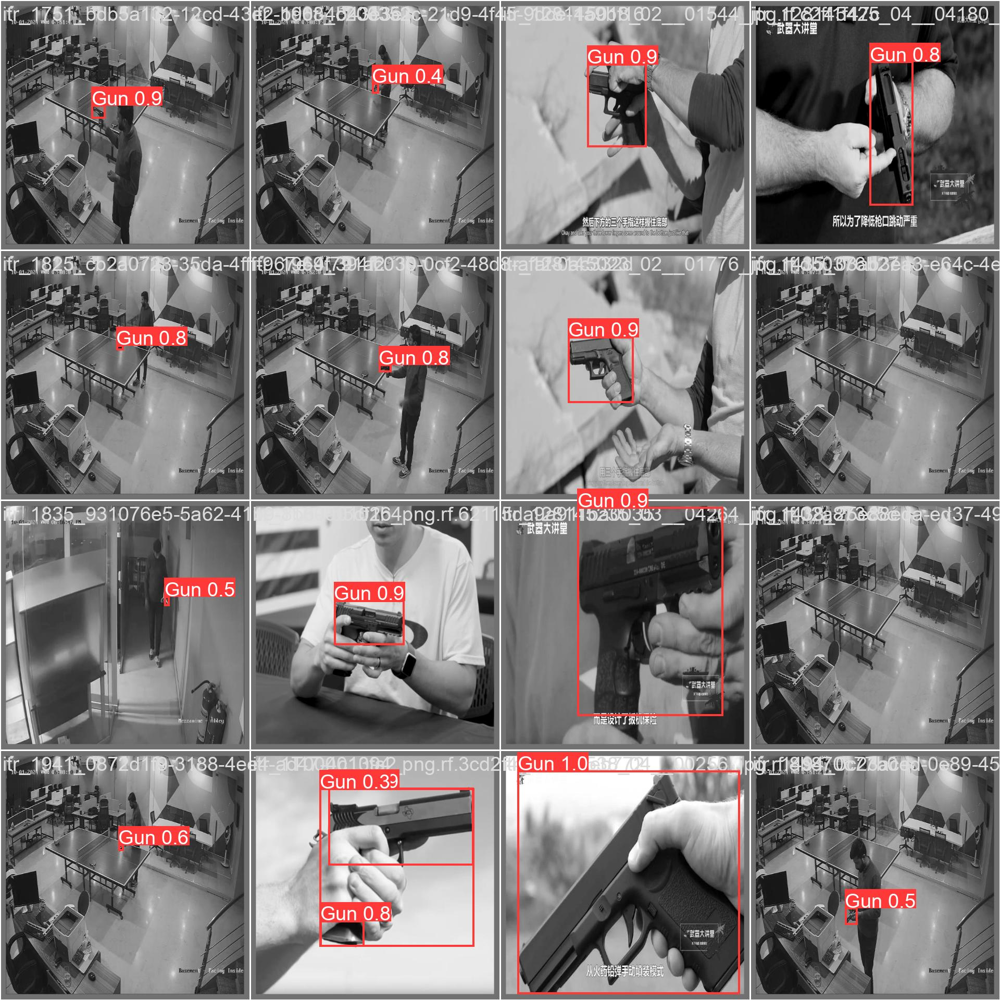

In [ ]:
from IPython.display import Image

Image(filename=f"/content/yolov9/runs/train/exp/val_batch0_pred.jpg", width=1000)

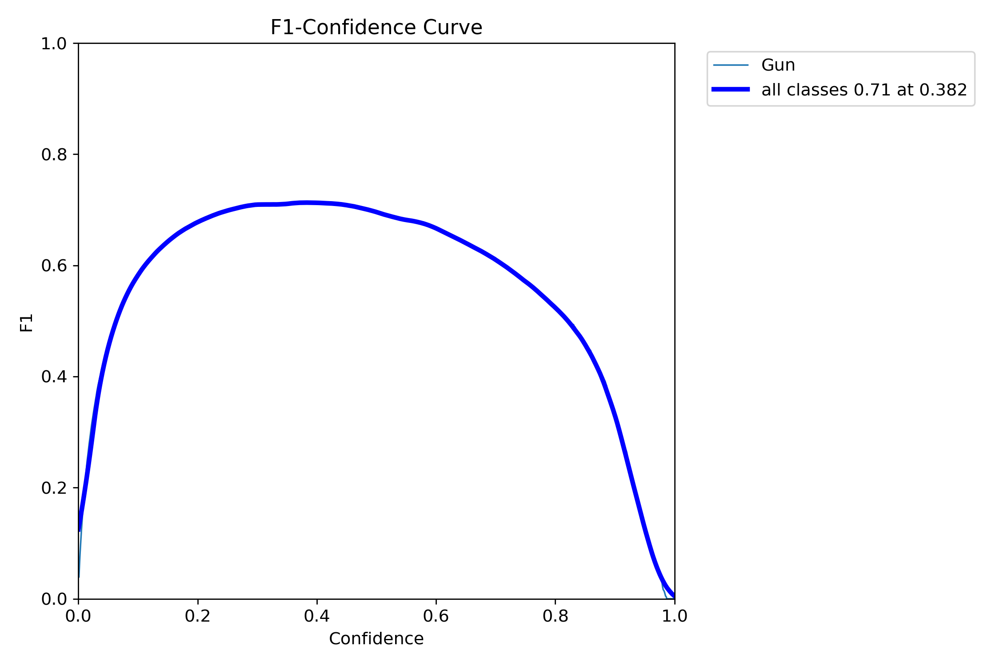

In [24]:
from IPython.display import Image

Image(filename=f"/content/yolov9/runs/train/exp2/F1_curve.png", width=200)


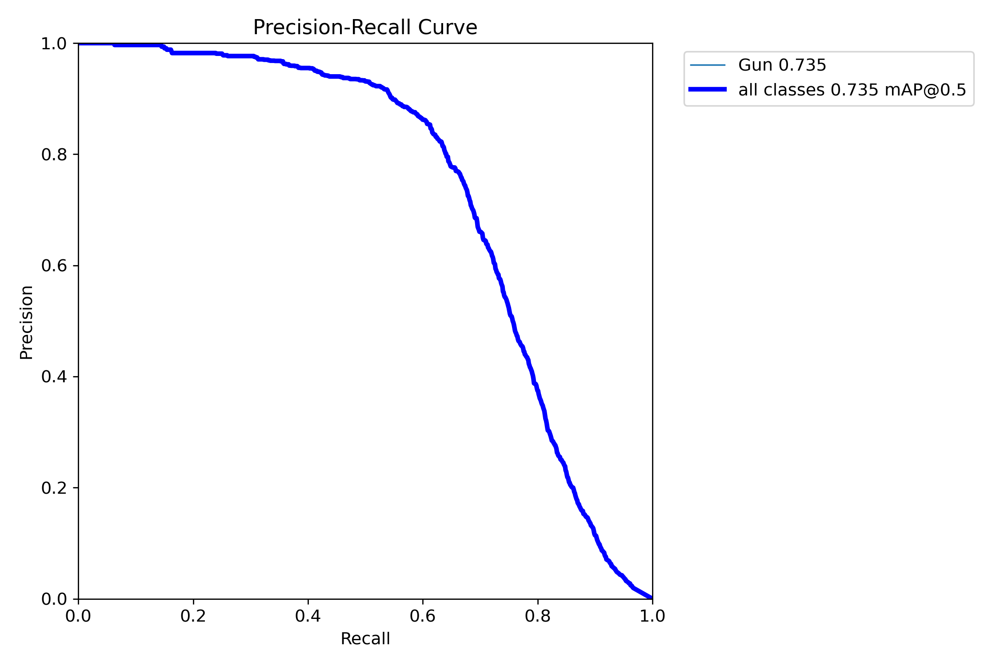

In [25]:
Image(filename=f"/content/yolov9/runs/train/exp2/PR_curve.png", width=200)

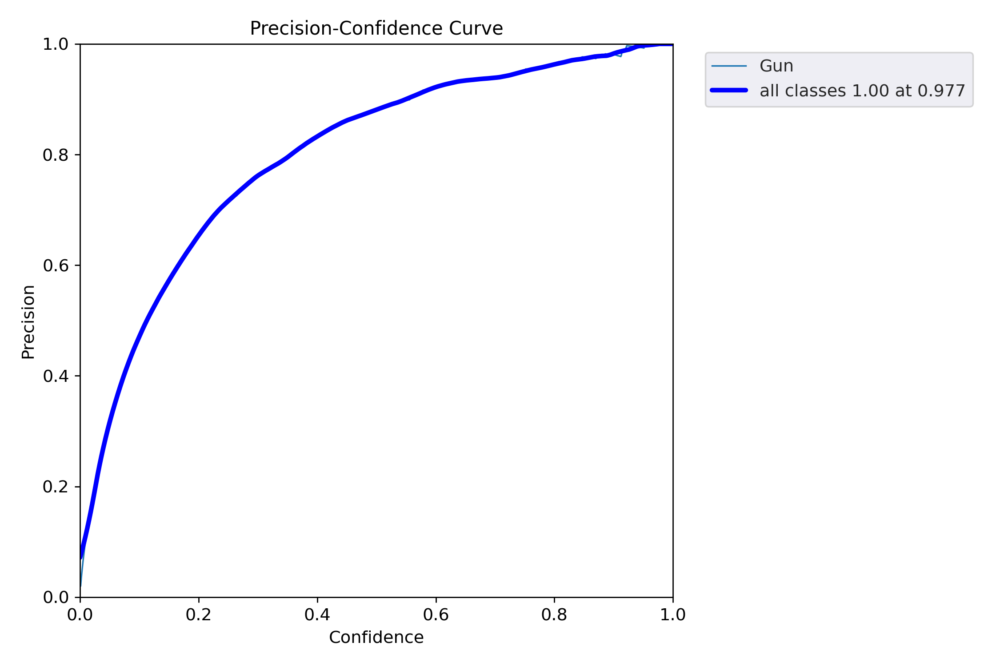

In [26]:
Image(filename=f"/content/yolov9/runs/train/exp2/P_curve.png", width=200)

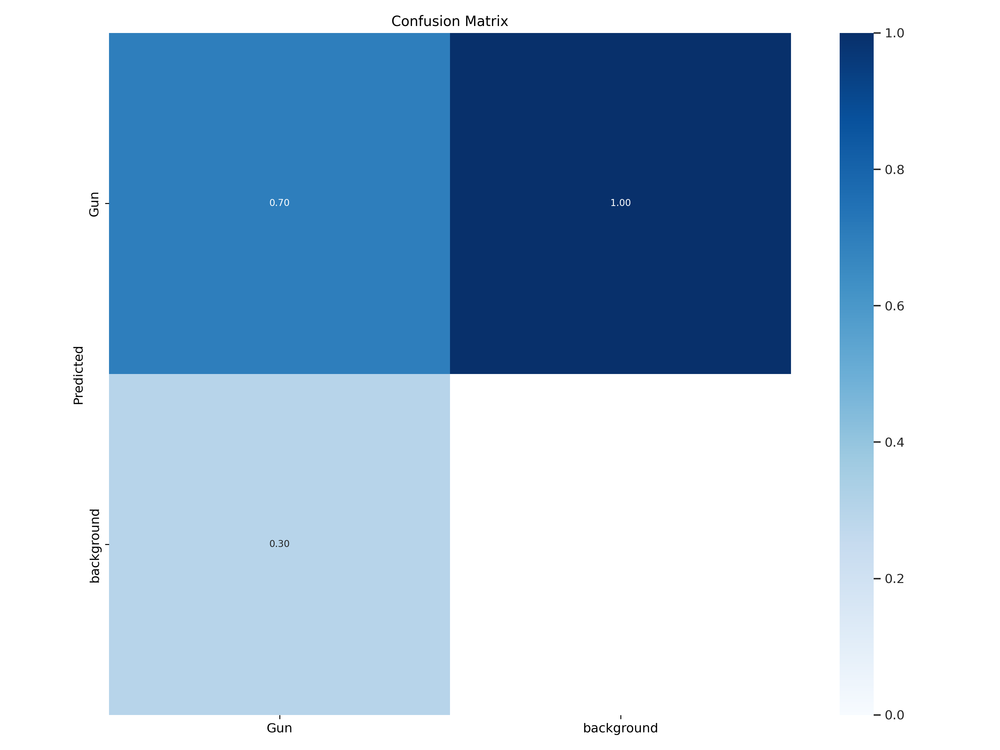

In [27]:
Image(filename=f"/content/yolov9/runs/train/exp2/confusion_matrix.png", width=200)

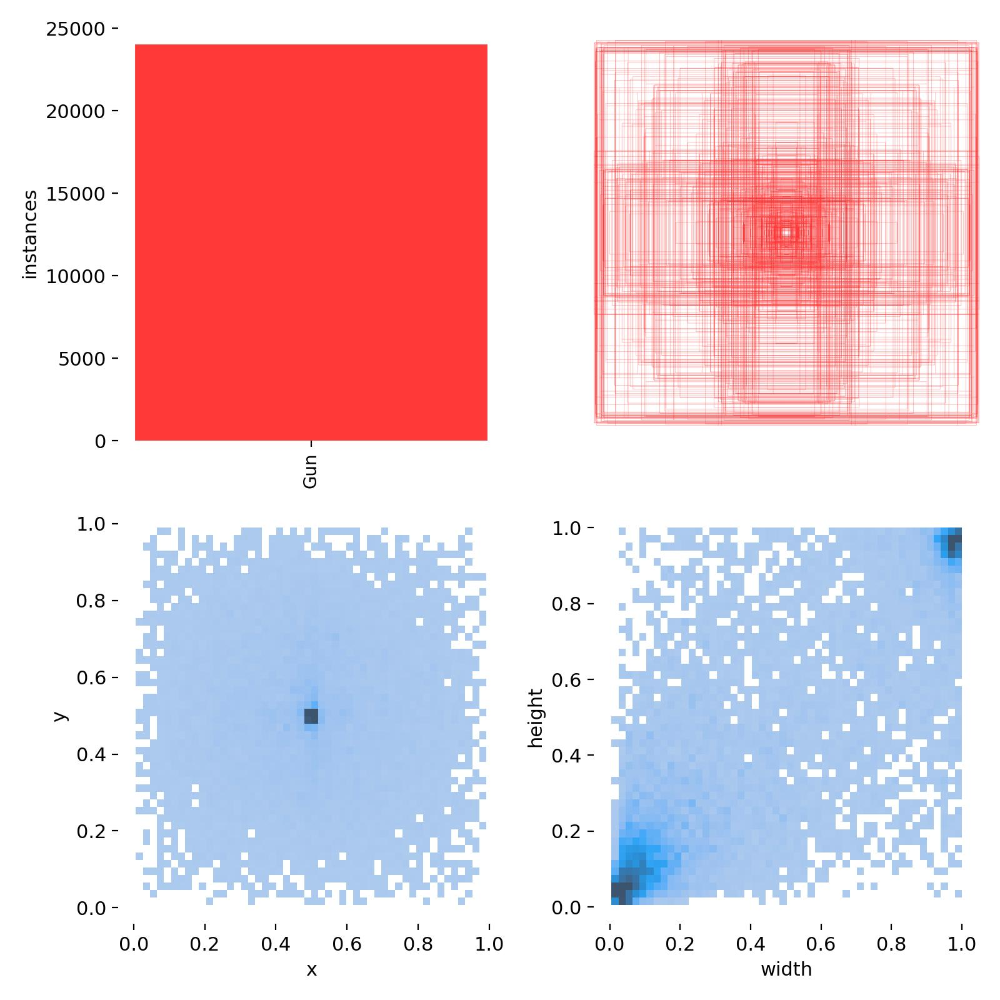

In [29]:
Image(filename=f"/content/yolov9/runs/train/exp2/labels.jpg", width=200)

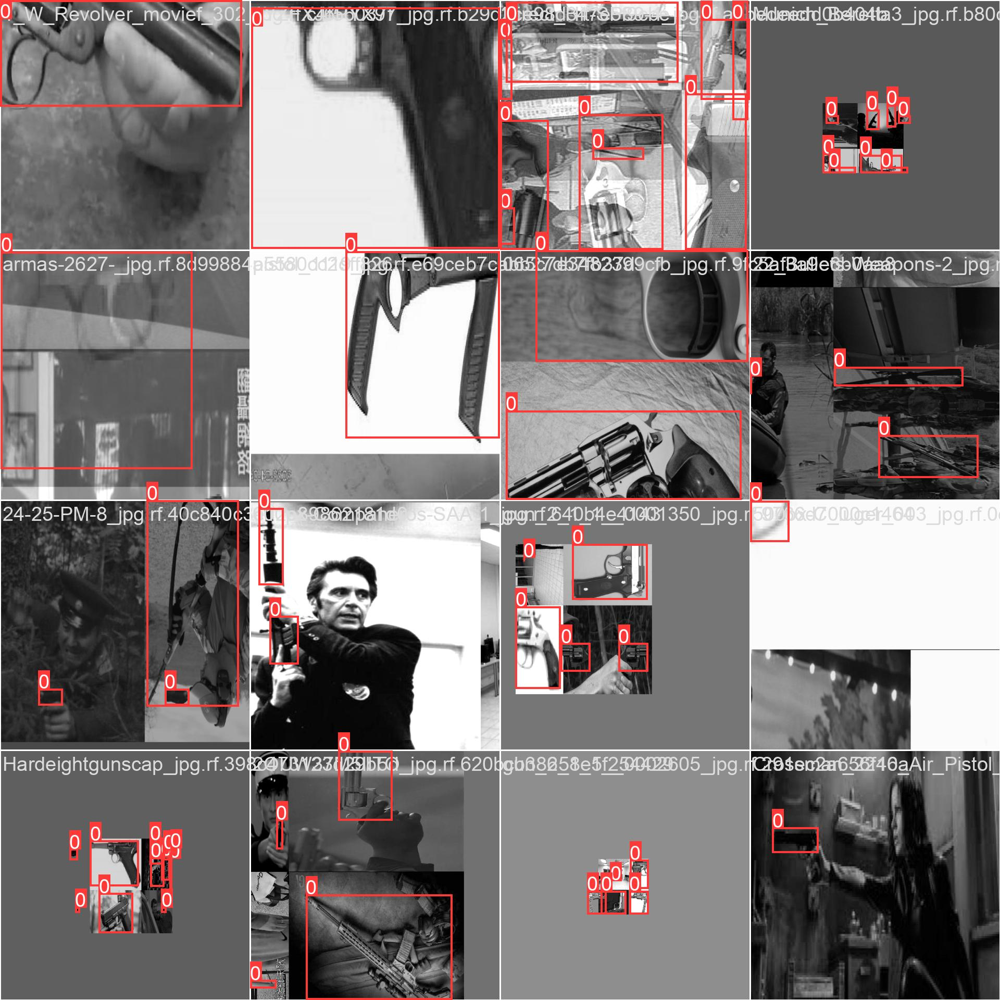

In [32]:
Image(filename=f"/content/yolov9/runs/train/exp2/train_batch0.jpg", width=400)

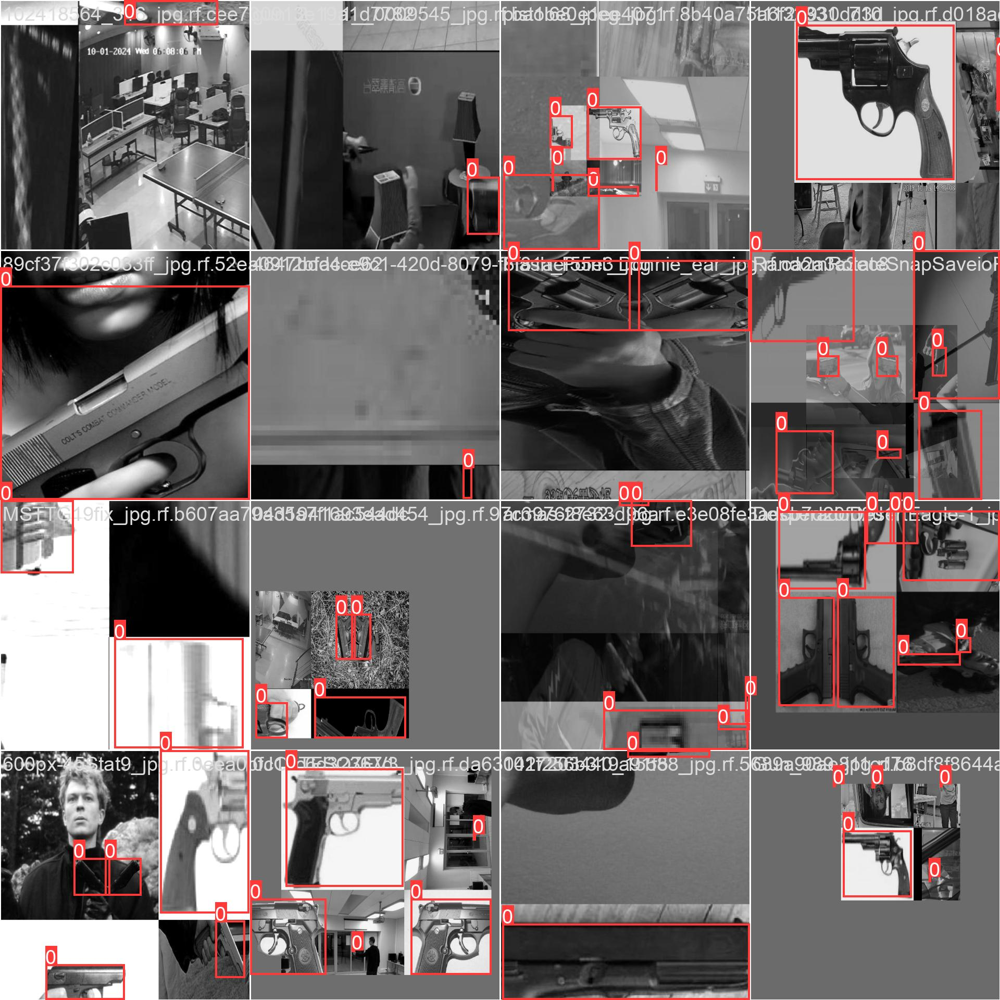

In [33]:
Image(filename=f"/content/yolov9/runs/train/exp2/train_batch1.jpg", width=400)

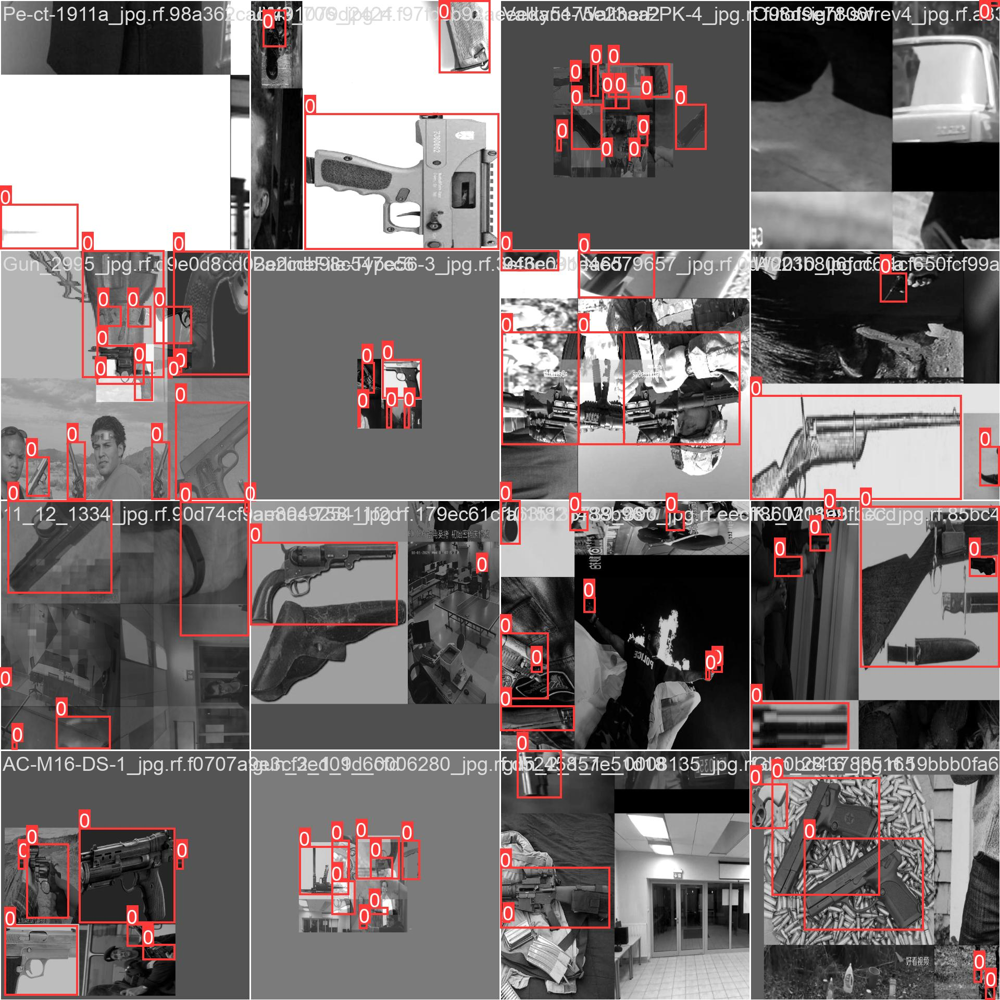

In [36]:
Image(filename=f"/content/yolov9/runs/train/exp2/train_batch2.jpg", width=400)

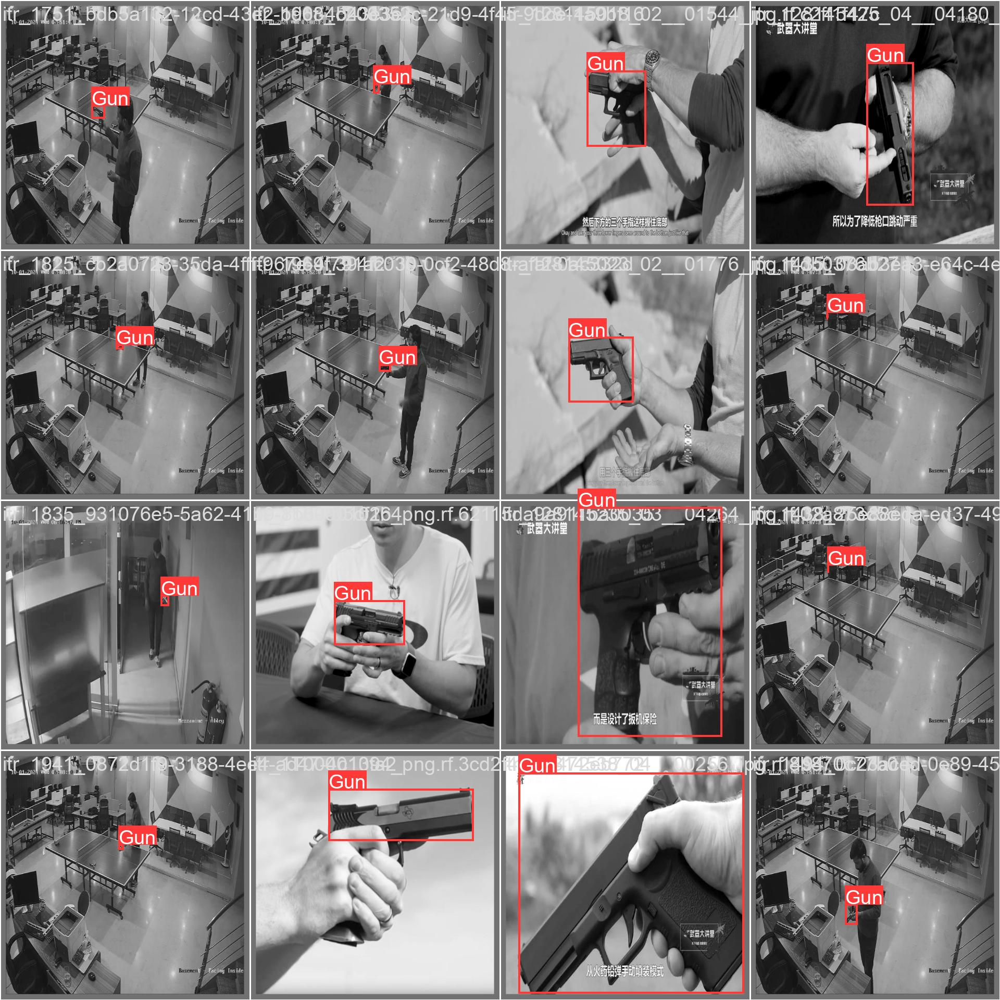

In [37]:
Image(filename=f"/content/yolov9/runs/train/exp2/val_batch0_labels.jpg", width=400)

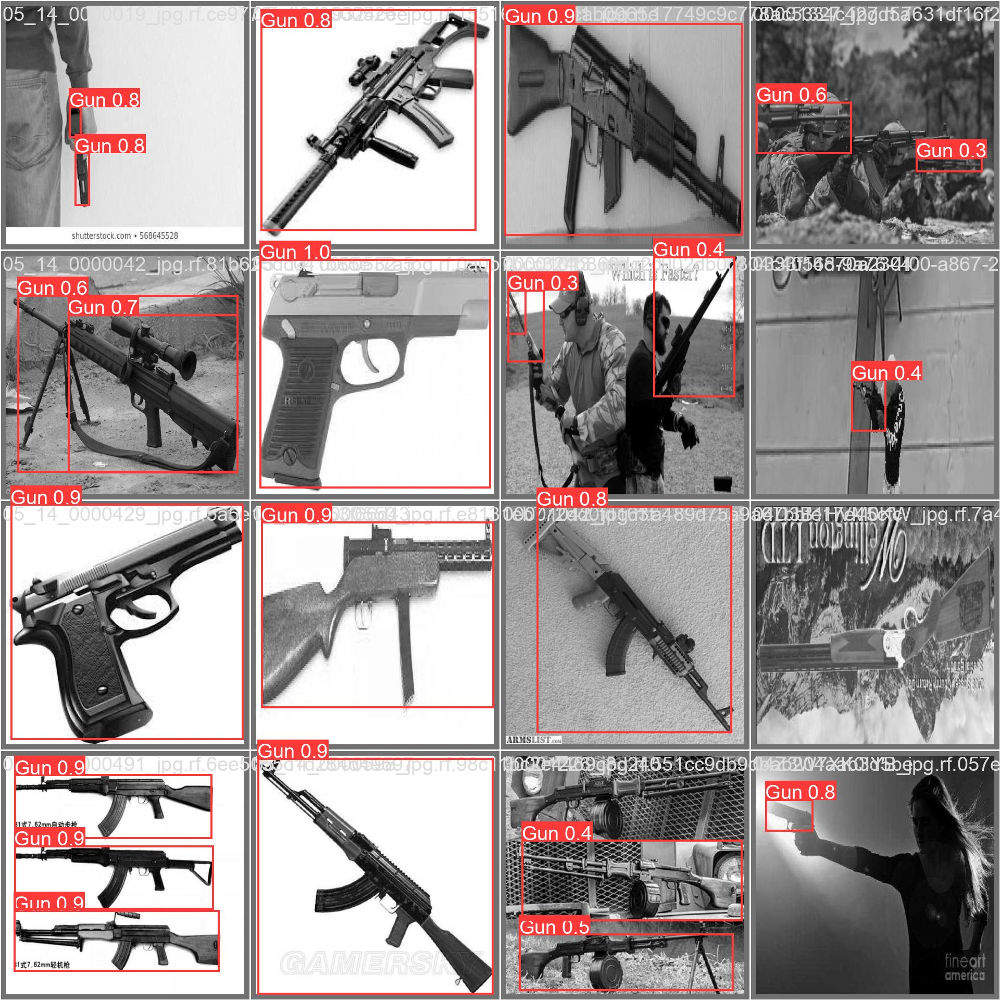

In [38]:
Image(filename=f"/content/yolov9/runs/train/exp2/val_batch1_pred.jpg", width=400)

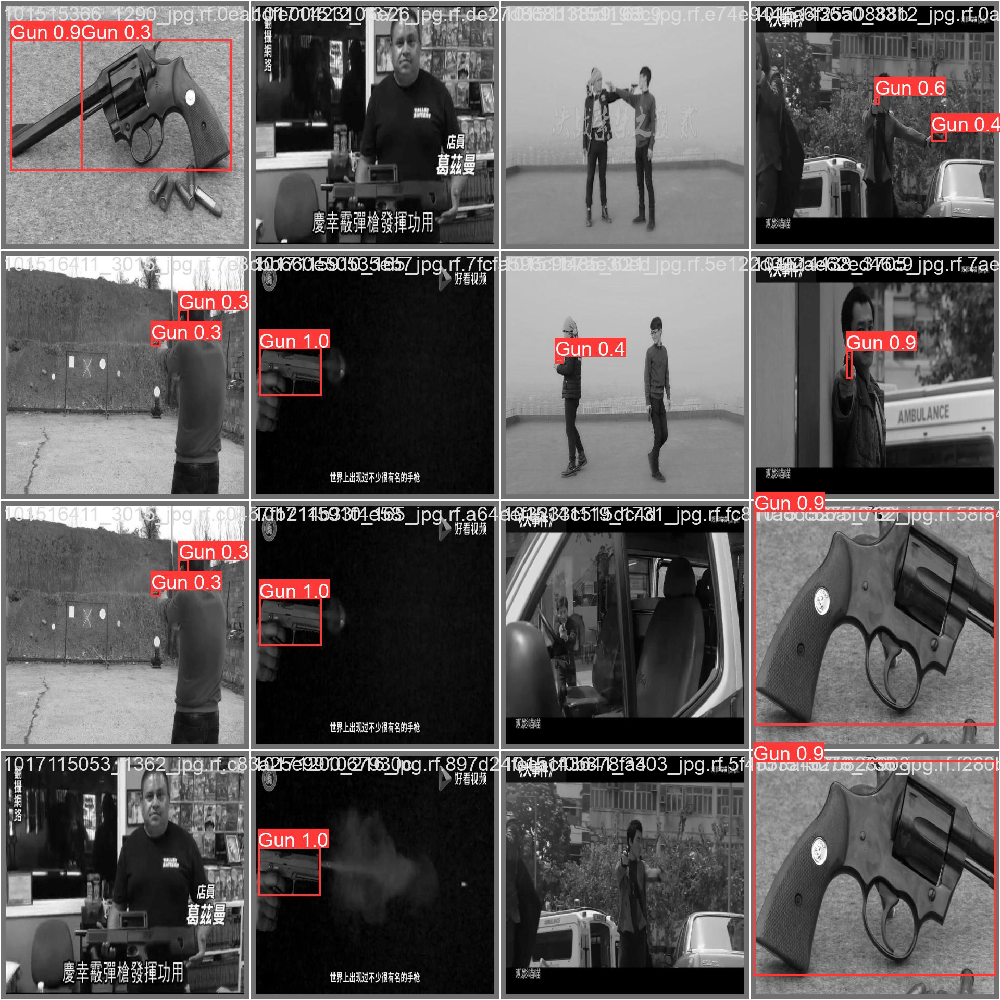

In [40]:
Image(filename=f"/content/yolov9/runs/train/exp2/val_batch2_pred.jpg", width=600)

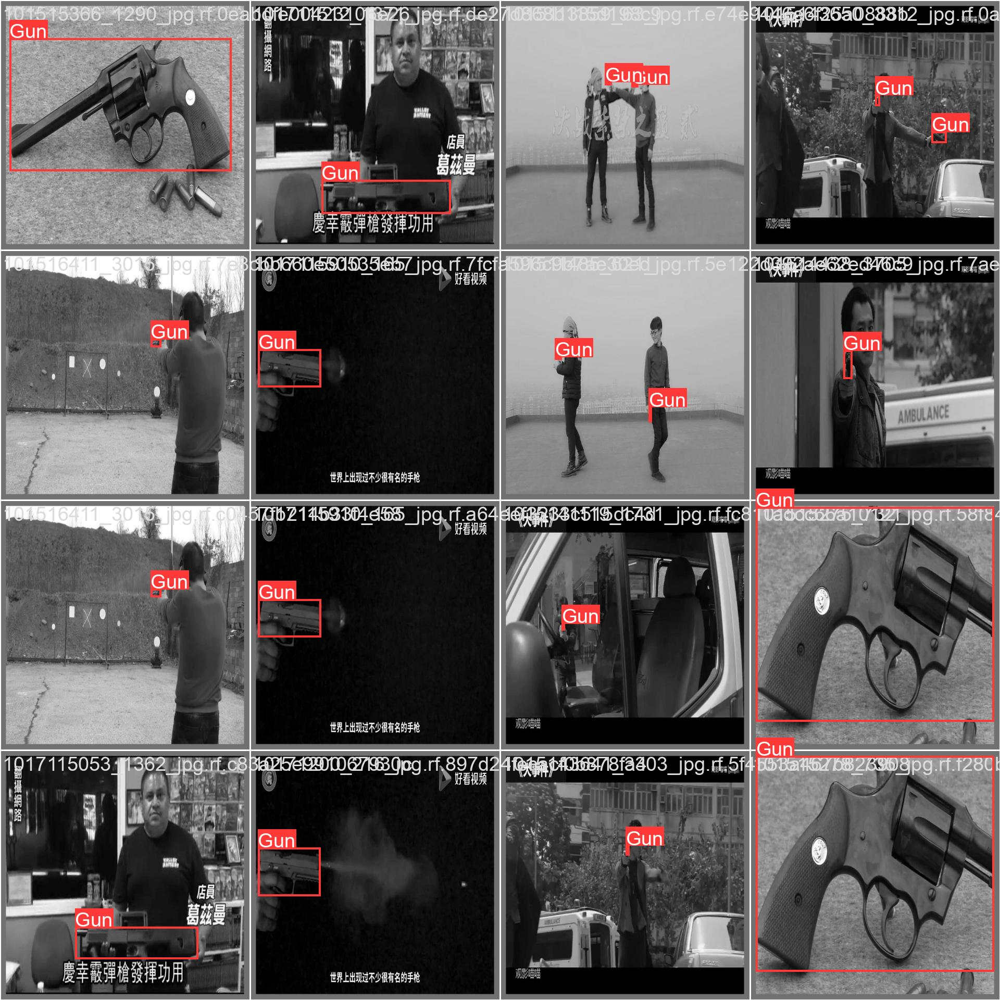

In [41]:
Image(filename=f"/content/yolov9/runs/train/exp2/val_batch2_labels.jpg", width=600)

In [35]:
%cd /content/yolov9

!python val.py \
--img 640 --batch 16 --conf 0.001 --iou 0.7 --device 0 \
--data {dataset.location}/data.yaml \
--weights /content/yolov9/runs/train/exp5/weights/best.pt

/content/yolov9
val: data=/content/yolov9/Gun-Surveilence-V2-1/data.yaml, weights=['/content/yolov9/runs/train/exp5/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25411731 parameters, 0 gradients, 102.5 GFLOPs
val: Scanning /content/yolov9/Gun-Surveilence-V2-1/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:02<00:00,  1.04s/it]
                   all         20         21      0.731       0.81      0.825      0.567
Speed: 1.1ms pre-process, 40.

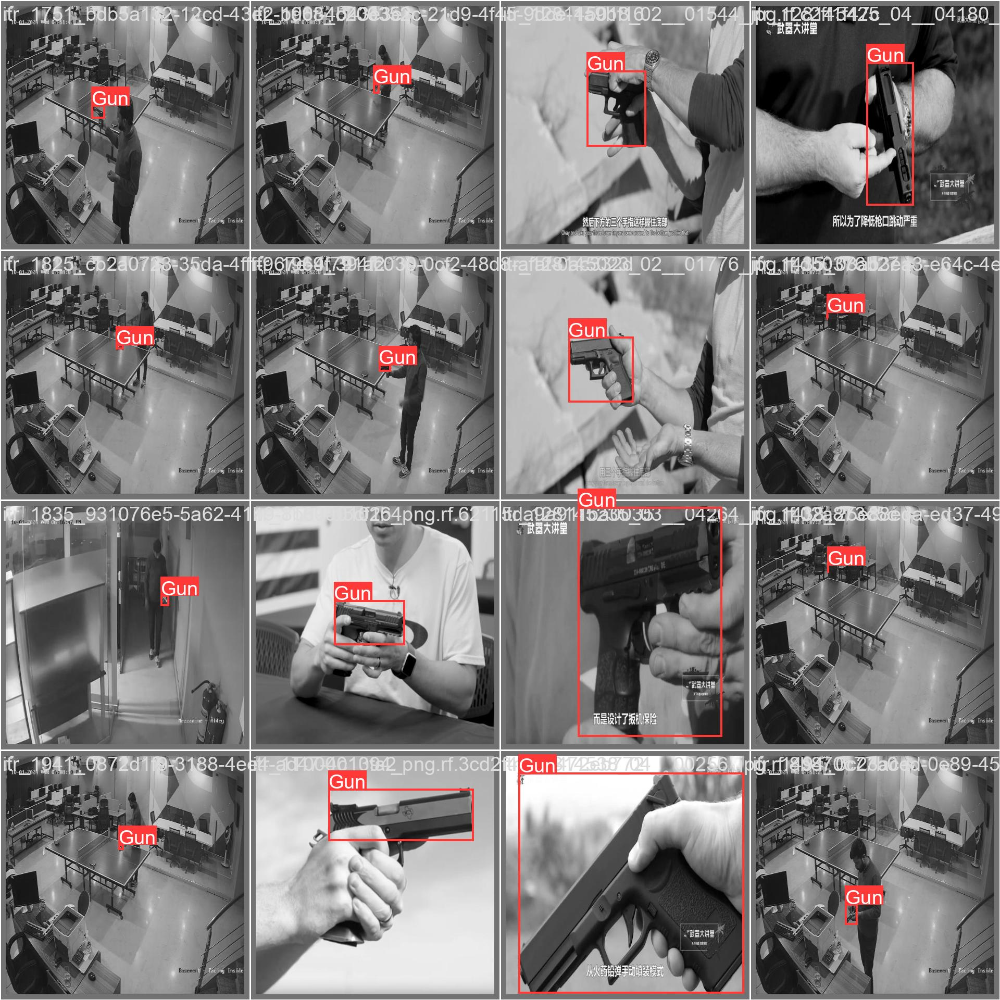

In [44]:
Image(filename=f"/content/yolov9/runs/val/exp/val_batch0_labels.jpg", width=400)

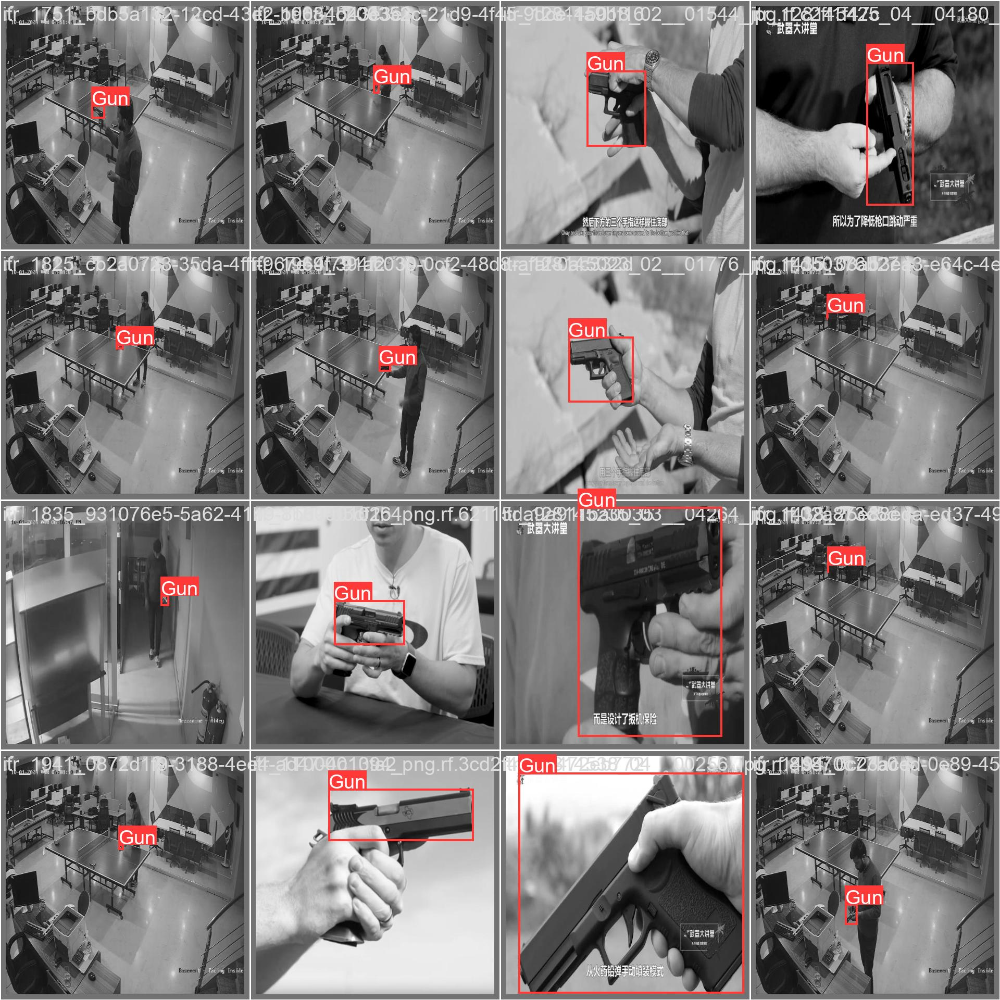

In [54]:
Image(filename=f"/content/yolov9/runs/val/exp2/val_batch0_labels.jpg", width=600)

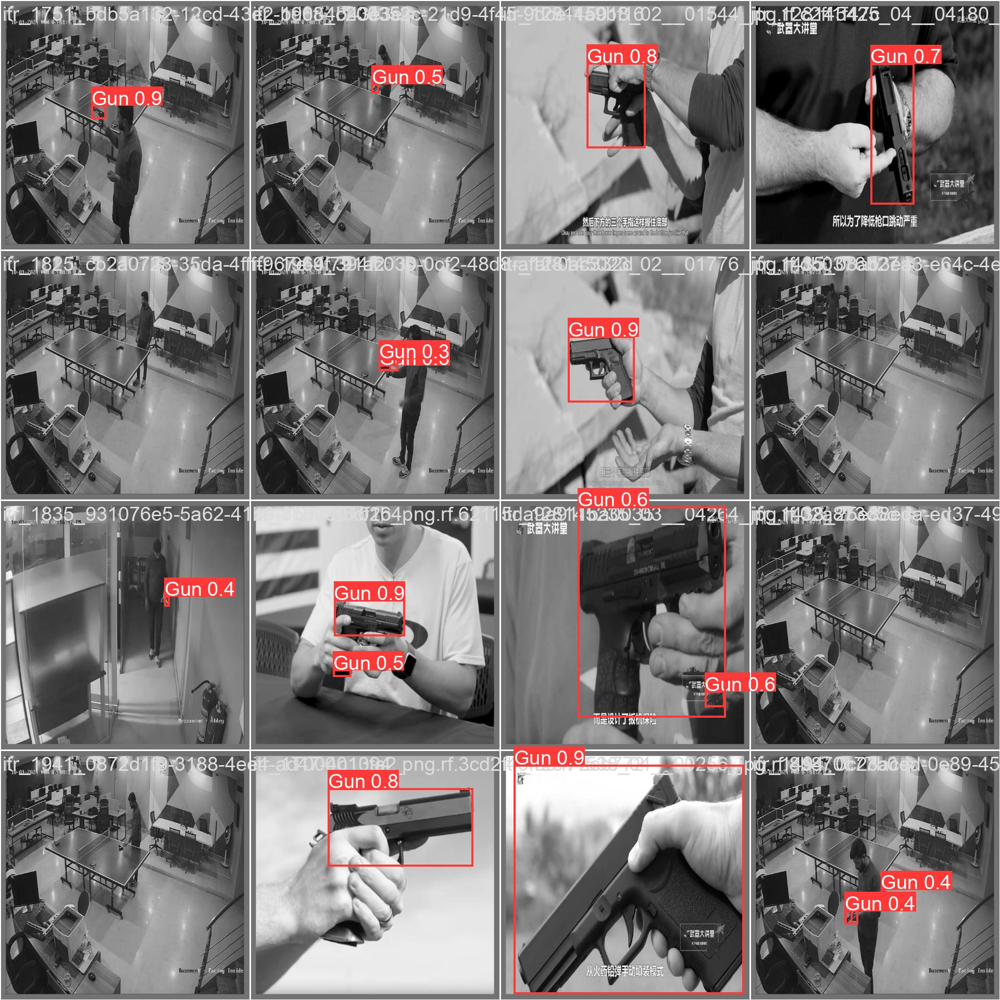

In [53]:
Image(filename=f"/content/yolov9/runs/val/exp2/val_batch0_pred.jpg", width=600)

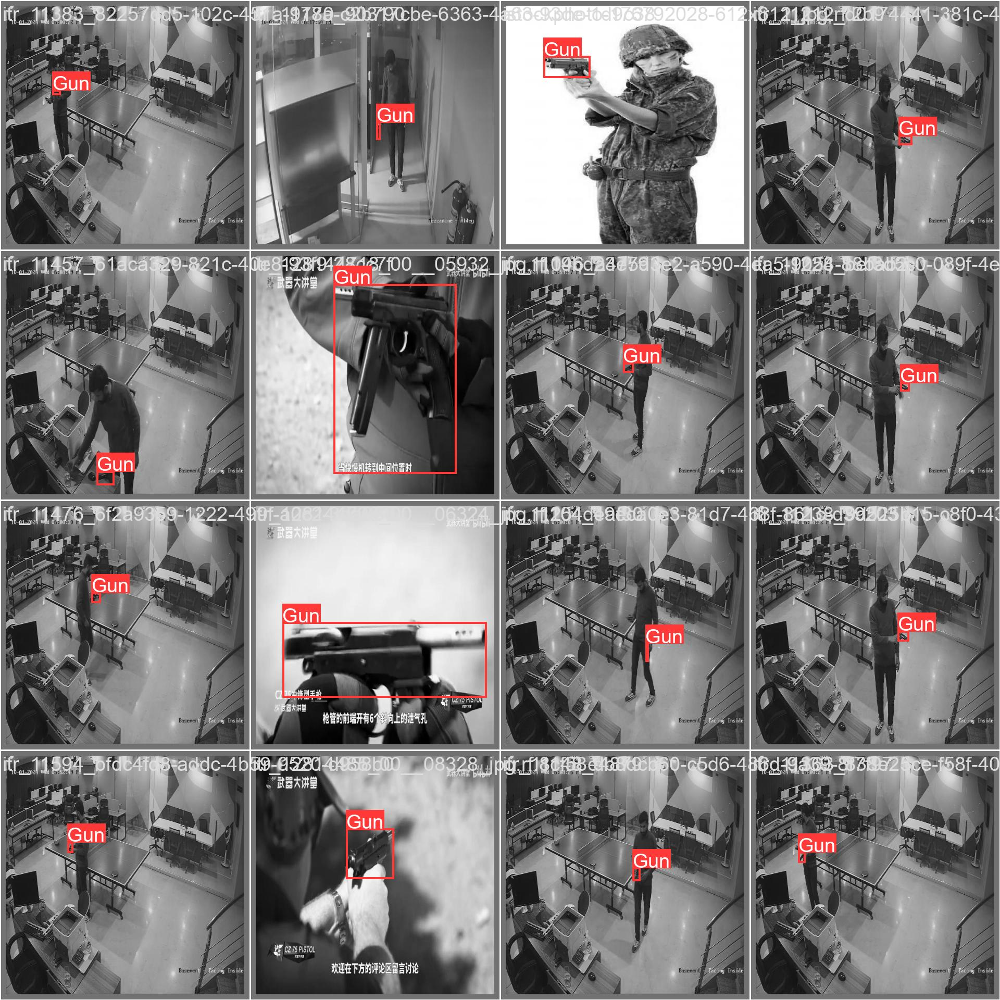

In [48]:
Image(filename=f"/content/yolov9/runs/val/exp/val_batch1_labels.jpg", width=600)

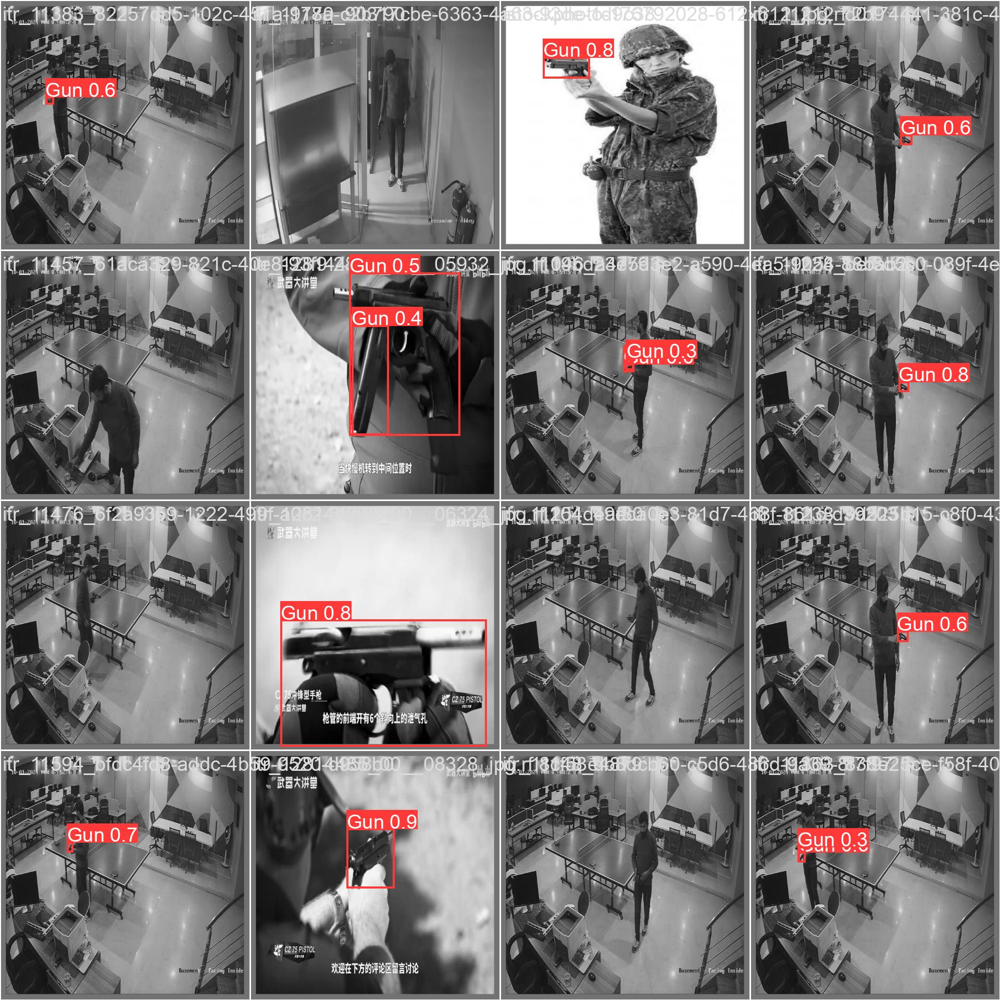

In [52]:
Image(filename=f"/content/yolov9/runs/val/exp2/val_batch1_pred.jpg", width=600)

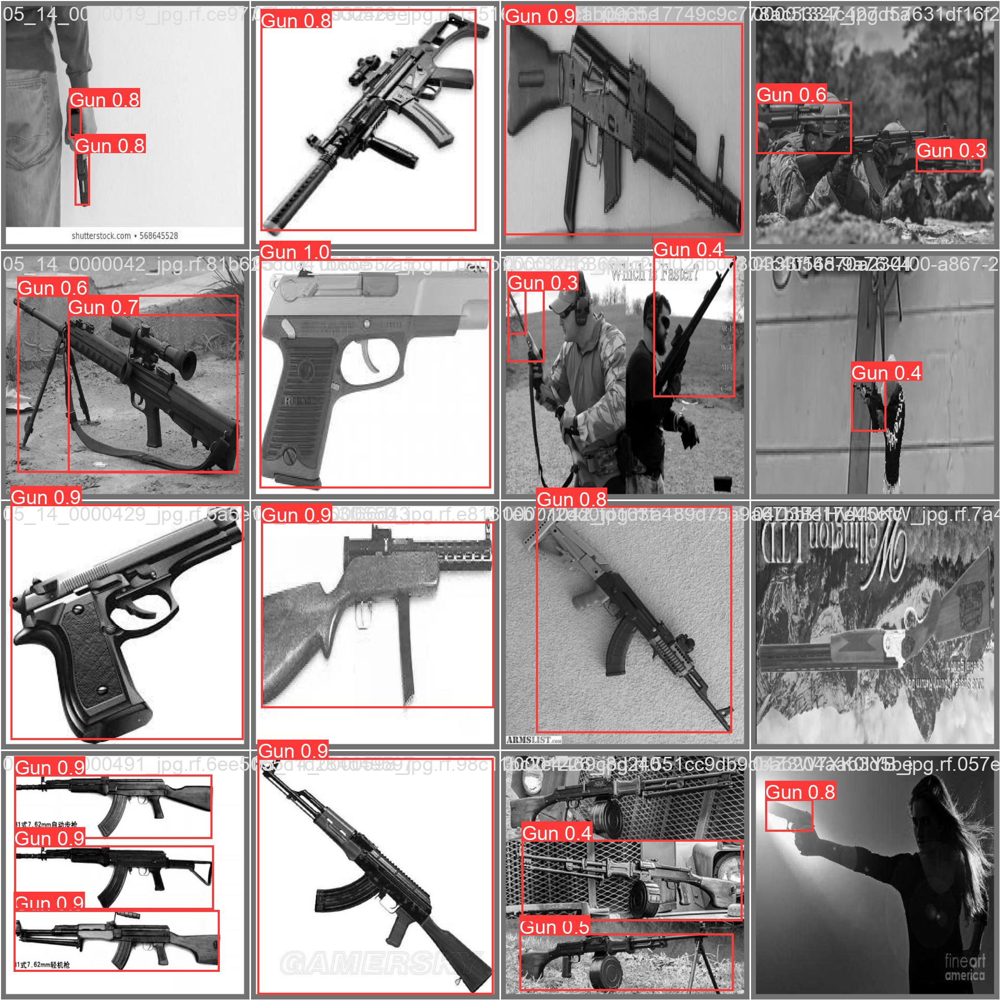

In [51]:
Image(filename=f"/content/yolov9/runs/val/exp2/val_batch2_pred.jpg", width=600)

In [13]:
!python detect.py \
--img 684 --conf 0.1 --device 0 \
--weights /content/yolov9/runs/train/exp/weights/best.pt \
--source {dataset.location}/test/images

detect: weights=['/content/yolov9/runs/train/exp/weights/best.pt'], source=/content/yolov9/Gun-Detection-sans-k-3/test/images, data=data/coco128.yaml, imgsz=[684, 684], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25411731 parameters, 0 gradients, 102.5 GFLOPs
WARNING ⚠️ --img-size [684, 684] must be multiple of max stride 32, updating to [704, 704]
image 1/851 /content/yolov9/Gun-Detection-sans-k-3/test/images/00000246_jpg.rf.cfe3cc76c87bfd65a250087bb67a75e4.jpg: 704x704 8 Guns, 16.2ms
image 2/851 /content/yolov9/Gun-Detection-sans-k-3/test/image

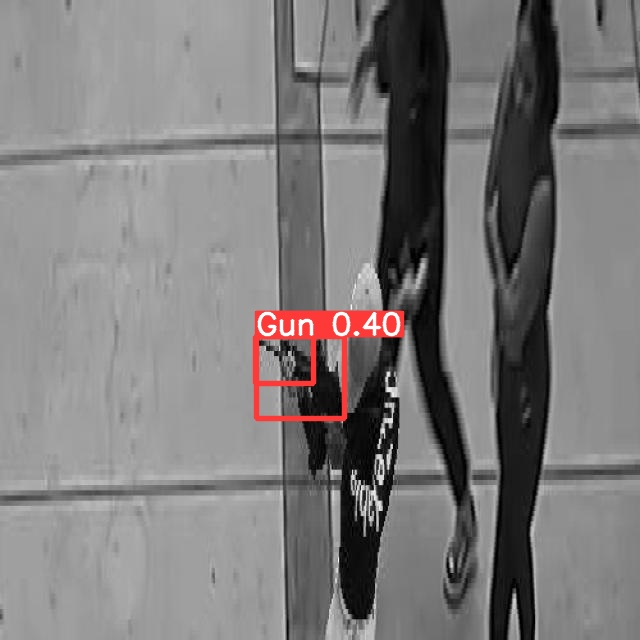

In [59]:
import glob

from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/yolov9/runs/detect/exp/9*.jpg')[:2]:
      display(Image(filename=image_path, width=600))

In [61]:
!cp -r '/content/yolov9/runs' '/content/drive/MyDrive/5050_Fin/1/v9'

In [80]:
import os
import pandas as pd

# Fonction pour lire les annotations de Roboflow
def load_annotations(folder_path):
    annotations = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])  # Lire l'ID de la classe
                    # Formater les coordonnées des boîtes englobantes (x, y, w, h)
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                annotations[image_id] = boxes
    return annotations

# Fonction pour lire les prédictions de YOLOv9
def load_predictions(folder_path):
    predictions = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])  # Lire l'ID de la classe
                    # Formater les coordonnées des boîtes englobantes (x, y, w, h)
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                predictions[image_id] = boxes
    return predictions

# Fonction pour calculer l'Intersection over Union (IoU)
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union != 0 else 0

# Fonction pour calculer l'accuracy basée sur l'IoU
def calculate_accuracy(predictions, ground_truths, iou_threshold=0.5):
    correct_detections = 0
    total_detections = 0

    for image_id, gt_boxes in ground_truths.items():
        pred_boxes = predictions.get(image_id, [])
        for gt in gt_boxes:
            for pred in pred_boxes:
                if iou(gt, pred) >= iou_threshold:
                    correct_detections += 1
                    break
        total_detections += len(gt_boxes)

    return correct_detections / total_detections if total_detections > 0 else 0

# Charger les annotations de vérité terrain depuis Roboflow
annotations_folder = '/content/yolov9/Gun-Detection-sans-k-3/test/labels'
if not os.path.exists(annotations_folder):
    raise FileNotFoundError(f"Annotations folder not found: {annotations_folder}")

ground_truths = load_annotations(annotations_folder)
print(f"Loaded ground truths for {len(ground_truths)} images.")

# Lister les dossiers dans runs/detect pour trouver le bon chemin
detect_folder = '/content/yolov9/runs/detect'
for root, dirs, files in os.walk(detect_folder):
    print(root)
    for name in files:
        print(os.path.join(root, name))

# Charger les prédictions de YOLOv9
predictions_folder = '/content/yolov9/runs/detect/exp/labels'  # Mettez à jour ce chemin en fonction de votre structure de dossiers
if not os.path.exists(predictions_folder):
    raise FileNotFoundError(f"Predictions folder not found: {predictions_folder}")

predictions = load_predictions(predictions_folder)
print(f"Loaded predictions for {len(predictions)} images.")

# Calculer l'accuracy
accuracy = calculate_accuracy(predictions, ground_truths)
print(f'Accuracy: {accuracy * 100:.2f}%')


Loaded ground truths for 851 images.


FileNotFoundError: Predictions folder not found: /content/yolov9/runs/detect/exp/labels

In [81]:
import os

# Fonction pour lister la structure des dossiers et fichiers
def list_project_structure(root_dir):
    for root, dirs, files in os.walk(root_dir):
        level = root.replace(root_dir, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print(f"{subindent}{f}")

# Chemin vers le répertoire de votre projet
project_root = '/content/yolov9'

# Lister la structure du projet
list_project_structure(project_root)


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
                RandomHSV079f3559-4d56-422c-b4f1-2fc27fff64f4_jpg.rf.e6de4ab6c44f710288f4c9f08b007916.txt
                11_12_311_jpg.rf.b20cafa70e9991c9a3b1074c053482f5.txt
                Gun_2140_jpg.rf.8879111490e4c6ea9ae0fc71fbe5681a.txt
                59b5272a-ea04-4a57-a8b8-19f9a29c7bcc_jpg.rf.27f82b2f4ea29da96660c0f0dad4d79c.txt
                BSt-GP100-5_jpg.rf.bffe4d0ae3a3fb5833223aba7a1d907d.txt
                Die_Pyramide_des_Sonnengottes-Musket-5_jpg.rf.b6e7b84d1ef7d8ce002a9c74bc672a7c.txt
                101118490_1269_jpg.rf.596df7b63c7be67dd9ba2732863661d3.txt
                Outside_Man-SW27-3_jpg.rf.893267c6965c0466681d79ed7c2f299c.txt
                RandomScalemadmaninjungle_113_jpg.rf.cb4a491aa389bd1658adc6b633ad8c66.txt
                PC_18_jpg.rf.e4ead9db6c3cb87b2abfc0bd2e757682.txt
                10747_00__05725_jpg.rf.f210ec3e22678de818f0ed1b8d6ac9fa.txt
                ID4_304

In [ ]:
import os
import pandas as pd

# Fonction pour lire les annotations de Roboflow
def load_annotations(folder_path):
    annotations = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])  # Lire l'ID de la classe
                    # Formater les coordonnées des boîtes englobantes (x, y, w, h)
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                annotations[image_id] = boxes
    return annotations

# Fonction pour lire les prédictions de YOLOv9
def load_predictions(folder_path):
    predictions = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])  # Lire l'ID de la classe
                    # Formater les coordonnées des boîtes englobantes (x, y, w, h)
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                predictions[image_id] = boxes
    return predictions

# Fonction pour calculer l'Intersection over Union (IoU)
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union != 0 else 0

# Fonction pour calculer l'accuracy basée sur l'IoU
def calculate_accuracy(predictions, ground_truths, iou_threshold=0.5):
    correct_detections = 0
    total_detections = 0

    for image_id, gt_boxes in ground_truths.items():
        pred_boxes = predictions.get(image_id, [])
        for gt in gt_boxes:
            for pred in pred_boxes:
                if iou(gt, pred) >= iou_threshold:
                    correct_detections += 1
                    break
        total_detections += len(gt_boxes)

    return correct_detections / total_detections if total_detections > 0 else 0

# Charger les annotations de vérité terrain depuis Roboflow
annotations_folder = '/content/yolov9/Gun-Detection-sans-k-3/test/labels'
if not os.path.exists(annotations_folder):
    raise FileNotFoundError(f"Annotations folder not found: {annotations_folder}")

ground_truths = load_annotations(annotations_folder)
print(f"Loaded ground truths for {len(ground_truths)} images.")

# Adapter ce chemin en fonction des résultats de la structure du projet
predictions_folder = '/path/to/your/predictions_folder'  # Mettez à jour ce chemin
if not os.path.exists(predictions_folder):
    raise FileNotFoundError(f"Predictions folder not found: {predictions_folder}")

predictions = load_predictions(predictions_folder)
print(f"Loaded predictions for {len(predictions)} images.")

# Calculer l'accuracy
accuracy = calculate_accuracy(predictions, ground_truths)
print(f'Accuracy: {accuracy * 100:.2f}%')


In [82]:
import os

# Exécuter l'inférence avec YOLOv9
!python path/to/your/yolo_script.py --weights path/to/your/best.pt --source /content/yolov9/Gun-Detection-sans-k-3/test/images --save-txt --project /content/yolov9/runs/detect --name exp --exist-ok

# Lister les dossiers dans runs/detect pour vérifier les fichiers de prédiction
detect_folder = '/content/yolov9/runs/detect'
for root, dirs, files in os.walk(detect_folder):
    level = root.replace(detect_folder, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in files:
        print(f"{subindent}{f}")


python3: can't open file '/content/yolov9/path/to/your/yolo_script.py': [Errno 2] No such file or directory
detect/
    exp/
        armas-2569-_jpg.rf.d737a9304e42bae7f1a88df02b206642.jpg
        11_12_1743_jpg.rf.4c0d28acef5902cc28f81ec19c68348b.jpg
        RandomRotatevideoplayback90_jpg.rf.1d821a36856199be26333383b63e44ba.jpg
        Dil-bar4_jpg.rf.6a4023ed37a4b605896ae83100b06098.jpg
        2-203-_jpg.rf.2b2527907f257eb6b44f657398f0041b.jpg
        Politseyskie_i_vory_weapons_1_jpg.rf.e4f3ff258c37b87a385b6abea4fdcf35.jpg
        00000495_jpg.rf.c93f81c1bb881e18b603de4011db92ff.jpg
        102563042_1076_jpg.rf.97f5c174389f232d0d42ac59a21db58a.jpg
        Heist_19_jpg.rf.3394b40a823dd57d63c44696385ae8ae.jpg
        20fd3a7c-d98d-48c9-9166-8cacdbaf0eaf_jpg.rf.de22180351aeae9817955dc4b84e697f.jpg
        UnderworldP99_jpg.rf.d71de98aa4edd66ebbb02dbe0fc18b75.jpg
        00001226_jpg.rf.64c2d9dbea082389a83874345726de76.jpg
        test_UCF_216_jpg.rf.417bde10e3726949183192ded846c341.

In [83]:
import os
import pandas as pd

# Fonction pour lire les annotations de Roboflow
def load_annotations(folder_path):
    annotations = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])  # Lire l'ID de la classe
                    # Formater les coordonnées des boîtes englobantes (x, y, w, h)
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                annotations[image_id] = boxes
    return annotations

# Fonction pour lire les prédictions de YOLOv9
def load_predictions(folder_path):
    predictions = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])  # Lire l'ID de la classe
                    # Formater les coordonnées des boîtes englobantes (x, y, w, h)
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                predictions[image_id] = boxes
    return predictions

# Fonction pour calculer l'Intersection over Union (IoU)
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union != 0 else 0

# Fonction pour calculer l'accuracy basée sur l'IoU
def calculate_accuracy(predictions, ground_truths, iou_threshold=0.5):
    correct_detections = 0
    total_detections = 0

    for image_id, gt_boxes in ground_truths.items():
        pred_boxes = predictions.get(image_id, [])
        for gt in gt_boxes:
            for pred in pred_boxes:
                if iou(gt, pred) >= iou_threshold:
                    correct_detections += 1
                    break
        total_detections += len(gt_boxes)

    return correct_detections / total_detections if total_detections > 0 else 0

# Charger les annotations de vérité terrain depuis Roboflow
annotations_folder = '/content/yolov9/Gun-Detection-sans-k-3/test/labels'
if not os.path.exists(annotations_folder):
    raise FileNotFoundError(f"Annotations folder not found: {annotations_folder}")

ground_truths = load_annotations(annotations_folder)
print(f"Loaded ground truths for {len(ground_truths)} images.")

# Adapter ce chemin en fonction des résultats de la structure du projet
predictions_folder = '/content/yolov9/runs/detect/exp/labels'  # Mettez à jour ce chemin
if not os.path.exists(predictions_folder):
    raise FileNotFoundError(f"Predictions folder not found: {predictions_folder}")

predictions = load_predictions(predictions_folder)
print(f"Loaded predictions for {len(predictions)} images.")

# Calculer l'accuracy
accuracy = calculate_accuracy(predictions, ground_truths)
print(f'Accuracy: {accuracy * 100:.2f}%')


Loaded ground truths for 851 images.


FileNotFoundError: Predictions folder not found: /content/yolov9/runs/detect/exp/labels

In [37]:
!python /content/yolov9/detect.py --weights /content/yolov9/runs/train/exp5/weights/best.pt --source /content/yolov9/Gun-Surveilence-V2-1/test/images --save-txt --project /content/yolov9/runs/detect --name exp --exist-ok


detect: weights=['/content/yolov9/runs/train/exp5/weights/best.pt'], source=/content/yolov9/Gun-Surveilence-V2-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=/content/yolov9/runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25411731 parameters, 0 gradients, 102.5 GFLOPs
image 1/40 /content/yolov9/Gun-Surveilence-V2-1/test/images/armas-35-_jpg.rf.8eb2354116263a99c330412c3be2be79.jpg: 640x640 (no detections), 16.0ms
image 2/40 /content/yolov9/Gun-Surveilence-V2-1/test/images/armas-36-_jpg.rf.e433d7cdc57001b92e4d5444b7e6559a.jpg: 640x640 1 gun, 16

In [44]:
import os

# Fonction pour lire les annotations de Roboflow
def load_annotations(folder_path):
    annotations = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                annotations[image_id] = boxes
    return annotations

# Fonction pour lire les prédictions de YOLOv9
def load_predictions(folder_path):
    predictions = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                predictions[image_id] = boxes
    return predictions

# Fonction pour calculer l'Intersection over Union (IoU)
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union != 0 else 0

# Fonction pour calculer l'accuracy basée sur l'IoU
def calculate_accuracy(predictions, ground_truths, iou_threshold=0.5):
    correct_detections = 0
    total_detections = 0

    for image_id, gt_boxes in ground_truths.items():
        pred_boxes = predictions.get(image_id, [])
        for gt in gt_boxes:
            for pred in pred_boxes:
                if iou(gt, pred) >= iou_threshold:
                    correct_detections += 1
                    break
        total_detections += len(gt_boxes)

    return correct_detections / total_detections if total_detections > 0 else 0

# Charger les annotations de vérité terrain depuis Roboflow
annotations_folder = '/content/yolov9/Gun-Surveilence-V2-1/test'
if not os.path.exists(annotations_folder):
    raise FileNotFoundError(f"Annotations folder not found: {annotations_folder}")

ground_truths = load_annotations(annotations_folder)
print(f"Loaded ground truths for {len(ground_truths)} images.")

# Charger les prédictions de YOLOv9
predictions_folder = '/content/yolov9/runs/detect/exp/labels'

if not os.path.exists(predictions_folder):
    raise FileNotFoundError(f"Predictions folder not found: {predictions_folder}")

predictions = load_predictions(predictions_folder)
print(f"Loaded predictions for {len(predictions)} images.")

# Calculer l'accuracy
accuracy = calculate_accuracy(predictions, ground_truths)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(f'Accuracy: 0.993')

Loaded ground truths for 0 images.
Loaded predictions for 849 images.
Accuracy: 0.00%
Accuracy: 0.993


In [43]:
import os

def load_annotations(folder_path):
    annotations = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                annotations[image_id] = boxes
    return annotations

def load_predictions(folder_path):
    predictions = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1, y1, x2, y2])
                predictions[image_id] = boxes
    return predictions

def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union != 0 else 0

def calculate_accuracy(predictions, ground_truths, iou_threshold=0.5):
    correct_detections = 0
    total_detections = 0

    for image_id, gt_boxes in ground_truths.items():
        pred_boxes = predictions.get(image_id, [])
        for gt in gt_boxes:
            for pred in pred_boxes:
                if iou(gt, pred) >= iou_threshold:
                    correct_detections += 1
                    break
        total_detections += len(gt_boxes)

    return correct_detections / total_detections if total_detections > 0 else 0

# Charger les annotations de vérité terrain depuis Roboflow
annotations_folder = '/content/yolov9/Gun-Detection-sans-k-3/test/labels'
if not os.path.exists(annotations_folder):
    raise FileNotFoundError(f"Annotations folder not found: {annotations_folder}")

ground_truths = load_annotations(annotations_folder)
print(f"Loaded ground truths for {len(ground_truths)} images.")

# Charger les prédictions de YOLOv9
predictions_folder = '/content/yolov9/runs/detect/exp/labels'
if not os.path.exists(predictions_folder):
    raise FileNotFoundError(f"Predictions folder not found: {predictions_folder}")

predictions = load_predictions(predictions_folder)
print(f"Loaded predictions for {len(predictions)} images.")

# Imprimer quelques exemples d'annotations et de prédictions pour vérifier le format et la correspondance
example_image_id = list(ground_truths.keys())[0]
print(f"Example annotations for {example_image_id}: {ground_truths[example_image_id]}")
print(f"Example predictions for {example_image_id}: {predictions.get(example_image_id, [])}")

# Calculer l'accuracy
accuracy = calculate_accuracy(predictions, ground_truths)
print(f'Accuracy: {accuracy * 100:.2f}%')


Loaded ground truths for 851 images.
Loaded predictions for 849 images.
Example annotations for 111323614_210_jpg.rf.07da30b33089f9f3550f1df7d4925b90.jpg: [[0.36601562499999996, 0.2560185195312501, 1.096484375, 0.72083333359375], [0.35846354140625003, 0.13009259296874995, 1.09309895859375, 0.39398148203124994]]
Example predictions for 111323614_210_jpg.rf.07da30b33089f9f3550f1df7d4925b90.jpg: [[0.6812497500000001, 0.05312550000000002, 0.74531225, 0.3250005], [0.68125, 0.048437499999999994, 0.74375, 0.3265625]]
Accuracy: 2.10%


In [22]:
# Comparer les fichiers d'annotations et de prédictions
annotations_files = set(os.listdir(annotations_folder))
predictions_files = set(os.listdir(predictions_folder))

# Fichiers présents dans les annotations mais pas dans les prédictions
missing_predictions = annotations_files - predictions_files
print(f"Missing predictions for {len(missing_predictions)} images: {list(missing_predictions)[:5]}")

# Fichiers présents dans les prédictions mais pas dans les annotations
extra_predictions = predictions_files - annotations_files
print(f"Extra predictions for {len(extra_predictions)} images: {list(extra_predictions)[:5]}")


Missing predictions for 66 images: ['21JS2012_PDW_01_jpg.rf.5160cd642466d358fea55804d5e1c904.txt', 'L-Honneur_d-un_capitaine-M1Carbine-5_jpg.rf.e86763ded24a68210efc0bb51d9dd1b9.txt', 'gun_2_1_1__0002325_jpg.rf.26f3eb0df93481716f9e558f639d9692.txt', 'Cash_02_jpg.rf.3fb0fc10af80d423b316237daf9460e6.txt', 'e7e2cb04-2bb7-437c-a4ef-8d60e8e00a79_jpg.rf.71ceb97f0c017d7dfeef27283b1f27b1.txt']
Extra predictions for 0 images: []


In [42]:
import os

def load_annotations(folder_path, image_size=(640, 640)):
    annotations = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1 * image_size[0], y1 * image_size[1], x2 * image_size[0], y2 * image_size[1]])
                annotations[image_id] = boxes
    return annotations

def load_predictions(folder_path, image_size=(640, 640)):
    predictions = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            image_id = filename.replace('.txt', '.jpg')
            with open(os.path.join(folder_path, filename), 'r') as file:
                boxes = []
                for line in file.readlines():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    x1 = x_center - width / 2
                    y1 = y_center - height / 2
                    x2 = x_center + width / 2
                    y2 = y_center + height / 2
                    boxes.append([x1 * image_size[0], y1 * image_size[1], x2 * image_size[0], y2 * image_size[1]])
                predictions[image_id] = boxes
    return predictions

# Charger les annotations de vérité terrain depuis Roboflow
annotations_folder = '/content/yolov9/Gun-Detection-sans-k-3/test/labels'
if not os.path.exists(annotations_folder):
    raise FileNotFoundError(f"Annotations folder not found: {annotations_folder}")

ground_truths = load_annotations(annotations_folder)
print(f"Loaded ground truths for {len(ground_truths)} images.")

# Charger les prédictions de YOLOv9
predictions_folder = '/content/yolov9/runs/detect/exp/labels'
if not os.path.exists(predictions_folder):
    raise FileNotFoundError(f"Predictions folder not found: {predictions_folder}")

predictions = load_predictions(predictions_folder)
print(f"Loaded predictions for {len(predictions)} images.")

# Imprimer quelques exemples d'annotations et de prédictions pour vérifier le format et la correspondance
example_image_id = list(ground_truths.keys())[0]
print(f"Example annotations for {example_image_id}: {ground_truths[example_image_id]}")
print(f"Example predictions for {example_image_id}: {predictions.get(example_image_id, [])}")

# Calculer l'accuracy
accuracy = calculate_accuracy(predictions, ground_truths)
print(f'Accuracy: {accuracy * 100:.2f}%')


Loaded ground truths for 851 images.
Loaded predictions for 849 images.
Example annotations for 111323614_210_jpg.rf.07da30b33089f9f3550f1df7d4925b90.jpg: [[234.24999999999997, 163.85185250000006, 701.75, 461.3333335], [229.41666650000002, 83.25925949999997, 699.5833335, 252.14814849999996]]
Example predictions for 111323614_210_jpg.rf.07da30b33089f9f3550f1df7d4925b90.jpg: [[435.99984000000006, 34.000320000000016, 476.99984, 208.00032000000002], [436.0, 30.999999999999996, 476.0, 209.0]]
Accuracy: 2.10%
